<a href="https://colab.research.google.com/github/nautim/digitalspacesciencespo/blob/main/TerrorAttacks_FinalNotebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Online Communication Surrounding Terrorist Attacks in France: A Comparative Analysis

##### <div style="text-align: right">  Project by Juan Arias Arango, Giacomo Da Ros, Timur Naushirvanov & Ludovica Pavoni <div>

### Introduction

Objectives: 
* Compare online communication before and after terrorist attacks.
* Identify the key themes and narratives that emerge in online communication related to terrorist attacks, and to assess how these themes and narratives change over time.
* Differentiate the attacks by partisanship or ideology  (those organised following far-right motives or by Islamists).

Methodology:
* Word counts and Wordclouds
* Sentiment Analysis
* Network Analysis
* Topic Modeling

### Data Collection

Separately done with the automated scripts kindly provided by Alessandro GALEAZZI.
* twitter_historical_search.py
* fast_data_cleaner.py

7 day before and after the following attacks:
* 28 October 2019 - Bayonne mosque shooting
* 29 October 2020 - Nice stabbing
* 23 April 2021 - Rambouillet knife attack
* 23 December 2022 - 2022 Paris shooting

Searching terms:
[‘(migration OR migrant OR immigre OR refugie OR asile OR accueil OR Islam OR musulman OR islamique OR hijab OR burqa OR voile OR terrorisme OR extremisme OR radicalisation OR djihadiste OR discrimination OR prejuges OR racisme OR islamophobie OR xenophobie) france lang:fr’]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
path = "/Users/nautim/Desktop/CEU DNDS/Winter 22:23/Diving into public space/data_project/combined_cleaned/" # Path to the data folder

In [ ]:
terror231222 = pd.read_csv(path+'terror231222_datausers_cleaned.csv.gz', compression='gzip', dtype='str', index_col=0)
terror230421 = pd.read_csv(path+'terror230421_datausers_cleaned.csv.gz', compression='gzip', dtype='str', index_col=0)
terror291020 = pd.read_csv(path+'terror291020_datausers_cleaned.csv.gz', compression='gzip', dtype='str', index_col=0)
terror281019 = pd.read_csv(path+'terror281019_datausers_cleaned.csv.gz', compression='gzip', dtype='str', index_col=0)

In [ ]:
# merge the dataframes into one and label them with the dataframes name
terror = pd.concat([terror231222.assign(dataset='terror231222'), 
                    terror230421.assign(dataset='terror230421'), 
                    terror291020.assign(dataset='terror291020'), 
                    terror281019.assign(dataset='terror281019')], ignore_index=True)
terror.head()

,id,author_id,created_at,edit_history_tweet_ids,lang,in_reply_to_user_id,conversation_id,text,reply_settings,possibly_sensitive,...,username,user_created_at,location,verified,description,user_followers_count,user_following_count,user_tweet_count,user_listed_count,dataset
0,1604949964429426688,1257932018,2022-12-19 21:21:04+00:00,1604949964429426688,fr,NaN,1604949964429426688,RT @_BeFootball: Quel accueil pour Léo Messi à...,everyone,False,...,sasa_97400,2013-03-10T20:49:32.000Z,"Nanterre, France",False,🇷🇪 ➡️🇫🇷,239,56,78214,0,terror231222
1,1604949944984653849,1417719872331595780,2022-12-19 21:21:00+00:00,1604949944984653849,fr,361857853,1604060382779396099,@Autochtone_fr @Jager80568144 @DubhStephane @A...,everyone,False,...,filleenvert8,2021-07-21T05:36:02.000Z,NaN,False,Les sauces 😍🤦‍♀️🤷🏼‍♀️ Éduque et instruit les i...,46,26,2701,0,terror231222
2,1604949933508816896,1470318045314887683,2022-12-19 21:20:57+00:00,1604949933508816896,fr,NaN,1604949933508816896,RT @Marc_Claret75: 🔴Acceuil des migrants :nous...,everyone,False,...,Valer2Valerie,2021-12-13T09:02:17.000Z,NaN,False,Aime la vie et la France,926,243,20744,0,terror231222
3,1604949930220847104,928722823,2022-12-19 21:20:56+00:00,1604949930220847104,fr,NaN,1604949930220847104,RT @Tajmaat_Service: 🇩🇿🇨🇵 FLASH - Un #Algérien...,everyone,False,...,SanouushRocma,2012-11-06T00:51:26.000Z,NaN,False,Moroccan girl,123,420,19293,1,terror231222
4,1604949860993695746,2199917760,2022-12-19 21:20:40+00:00,1604949860993695746,fr,NaN,1604949860993695746,RT @chaine_verte: La Chaîne Verte est un group...,everyone,False,...,avel_du,2013-11-17T17:43:49.000Z,Barre à Tribord toute,False,Pour la réunification de la Bretagne à 5 Dépar...,3292,3737,125912,41,terror231222


In [ ]:
terror.columns

Index(['id', 'author_id', 'created_at', 'edit_history_tweet_ids', 'lang',
       'in_reply_to_user_id', 'conversation_id', 'text', 'reply_settings',
       'possibly_sensitive', 'place_id', 'place_type', 'coord', 'media_keys',
       'retweeted_id', 'quoted_id', 'replied_id', 'url', 'expanded_url',
       'unwound_url', 'title_url', 'description_url', 'mention_name',
       'hashtags', 'annotations', 'retweet_count', 'reply_count', 'like_count',
       'quote_count', 'impression_count', 'name', 'username',
       'user_created_at', 'location', 'verified', 'description',
       'user_followers_count', 'user_following_count', 'user_tweet_count',
       'user_listed_count', 'dataset'],
      dtype='object')

In [ ]:
print(f"The dataset contains {terror.shape[0]} rows (tweets) and {terror.shape[1]} columns.")

The dataset contains 418850 rows (tweets) and 41 columns.


We can create a separate dataframe that contains only tweets with a unique text, and that are not retweets.

In [ ]:
terror_nodups = terror.drop_duplicates(subset=['text'])
terror_nodups.reset_index(drop=True, inplace=True)
print(f"The dataset contains {terror_nodups.shape[0]} tweets with unique text and {terror_nodups.shape[1]} columns.")

The dataset contains 118576 tweets with unique text and 41 columns.


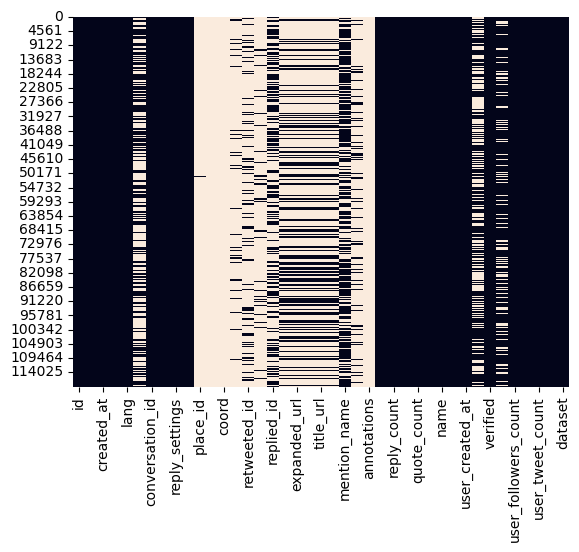

In [ ]:
# heatmap of missing values
sns.heatmap(terror_nodups.isnull(), cbar=False);

### Text Processing

In [ ]:
#!pip install FrenchLefffLemmatizer
#!pip install unidecode

import nltk
import string
from french_lefff_lemmatizer.french_lefff_lemmatizer import FrenchLefffLemmatizer
import re
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
from unidecode import unidecode
import ast

nltk.download('wordnet')
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to /Users/nautim/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /Users/nautim/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nautim/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# specify the language of the stopwords and the lemmatizer
french_stopwords = nltk.corpus.stopwords.words('french')
lemmatizer = FrenchLefffLemmatizer()

# the following stopwords are removed from the list of stopwords because they are important in the context of the tweets 
french_stopwords.remove('pas')
french_stopwords.remove('ne')
french_stopwords.append('rt')
french_stopwords.append('a')

In [ ]:
def clean_twitter_token(row):
    row = re.sub(r"RT|(@[A-Za-z0-9_]+)|#|http\S+", "", row).strip().lower() # remove RT, @mentions, hashtags, urls, spaces before and after, and convert to lowercase
    row = re.sub(r"[^\w\s]", " ", row).strip().lower() # remove punctiation
    row = nltk.tokenize.word_tokenize(row)
    row = [i for i in row if i not in french_stopwords]
    return row
 
def lemmitized_text(row):
    row = [lemmatizer.lemmatize(i) for i in row]
    return row

stemmer_french = nltk.SnowballStemmer('french')
def stemming_text(row):
    row = [stemmer_french.stem(i) for i in row]
    return row

In [ ]:
terror_nodups['text_tokenized'] = terror_nodups['text'].apply(clean_twitter_token)
terror_nodups['text_lemmitized'] = terror_nodups['text_tokenized'].apply(lemmitized_text)
terror_nodups['tokens_merged'] = terror_nodups['text_lemmitized'].apply(lambda x: ' '.join(x))
terror_nodups['text_stemm'] = terror_nodups['text_tokenized'].apply(stemming_text)

In [ ]:
# additional processing for the wordcloud

stopWords = ['a', 'abord', 'absolument', 'afin', 'ah', 'ai', 'aie', 'ailleurs', 'ainsi', 'ait', 'allaient', 'allo', 'allons', 
             'allô', 'alors', 'anterieur', 'anterieure', 'anterieures', 'apres', 'après', 'as', 'assez', 'attendu', 'au', 
             'aucun', 'aucune', 'aujourd', "aujourd'hui", 'aupres', 'auquel', 'aura', 'auraient', 'aurait', 'auront', 'aussi', 
             'autre', 'autrefois', 'autrement', 'autres', 'autrui', 'aux', 'auxquelles', 'auxquels', 'avaient', 'avais', 'avait', 
             'avant', 'avec', 'avoir', 'avons', 'ayant', 'bah', 'bas', 'basee', 'bat', 'beau', 'beaucoup', 'bien', 'bigre', 'boum', 
             'bravo', 'brrr', "c'", 'car', 'ce', 'ceci', 'cela', 'celle', 'celle-ci', 'celle-là', 'celles', 'celles-ci', 'celles-là', 
             'celui', 'celui-ci', 'celui-là', 'cent', 'cependant', 'certain', 'certaine', 'certaines', 'certains', 'certes', 'ces', 
             'cet', 'cette', 'ceux', 'ceux-ci', 'ceux-là', 'chacun', 'chacune', 'chaque', 'cher', 'chers', 'chez', 'chiche', 'chut', 
             'chère', 'chères', 'ci', 'cinq', 'cinquantaine', 'cinquante', 'cinquantième', 'cinquième', 'clac', 'clic', 'combien', 
             'comme', 'comment', 'comparable', 'comparables', 'compris', 'concernant', 'contre', 'couic', 'crac', 'c’', "d'", 'da', 
             'dans', 'de', 'debout', 'dedans', 'dehors', 'deja', 'delà', 'depuis', 'dernier', 'derniere', 'derriere', 'derrière', 
             'des', 'desormais', 'desquelles', 'desquels', 'dessous', 'dessus', 'deux', 'deuxième', 'deuxièmement', 'devant', 'devers', 
             'devra', 'different', 'differentes', 'differents', 'différent', 'différente', 'différentes', 'différents', 'dire', 
             'directe', 'directement', 'dit', 'dite', 'dits', 'divers', 'diverse', 'diverses', 'dix', 'dix-huit', 'dix-neuf', 
             'dix-sept', 'dixième', 'doit', 'doivent', 'donc', 'dont', 'douze', 'douzième', 'dring', 'du', 'duquel', 'durant', 'dès', 
             'désormais', 'd’', 'effet', 'egale', 'egalement', 'egales', 'eh', 'elle', 'elle-même', 'elles', 'elles-mêmes', 'en', 
             'encore', 'enfin', 'entre', 'envers', 'environ', 'es', 'est', 'et', 'etaient', 'etais', 'etait', 'etant', 'etc', 'etre', 
             'eu', 'euh', 'eux', 'eux-mêmes', 'exactement', 'excepté', 'extenso', 'exterieur', 'fais', 'faisaient', 'faisant', 'fait', 
             'façon', 'feront', 'fi', 'flac', 'floc', 'font', 'gens', 'ha', 'hein', 'hem', 'hep', 'hi', 'ho', 'holà', 'hop', 'hormis', 
             'hors', 'hou', 'houp', 'hue', 'hui', 'huit', 'huitième', 'hum', 'hurrah', 'hé', 'hélas', 'i', 'il', 'ils', 'importe', 
             "j'", 'je', 'jusqu', 'jusque', 'juste', 'j’', "l'", 'la', 'laisser', 'laquelle', 'las', 'le', 'lequel', 'les', 
             'lesquelles', 'lesquels', 'leur', 'leurs', 'longtemps', 'lors', 'lorsque', 'lui', 'lui-meme', 'lui-même', 'là', 'lès', 'l’', 
             "m'", 'ma', 'maint', 'maintenant', 'mais', 'malgre', 'malgré', 'maximale', 'me', 'meme', 'memes', 'merci', 'mes', 'mien', 'mienne', 
             'miennes', 'miens', 'mille', 'mince', 'minimale', 'moi', 'moi-meme', 'moi-même', 'moindres', 'moins', 'mon', 
             'moyennant', 'même', 'mêmes', 'm’', "n'", 'na', 'naturel', 'naturelle', 'naturelles', 'ne', 'neanmoins', 'necessaire', 
             'necessairement', 'neuf', 'neuvième', 'ni', 'nombreuses', 'nombreux', 'non', 'nos', 'notamment', 'notre', 'nous', 'nous-mêmes', 
             'nouveau', 'nul', 'néanmoins', 'nôtre', 'nôtres', 'n’', 'o', 'oh', 'ohé', 'ollé', 'olé', 'on', 'ont', 'onze', 'onzième', 'ore', 
             'ou', 'ouf', 'ouias', 'oust', 'ouste', 'outre', 'ouvert', 'ouverte', 'ouverts', 'où', 'paf', 'pan', 'par', 'parce', 'parfois', 
             'parle', 'parlent', 'parler', 'parmi', 'parseme', 'partant', 'particulier', 'particulière', 'particulièrement', 'pas', 'passé', 
             'pendant', 'pense', 'permet', 'personne', 'peu', 'peut', 'peuvent', 'peux', 'pff', 'pfft', 'pfut', 'pif', 'pire', 'plein', 'plouf', 
             'plus', 'plusieurs', 'plutôt', 'possessif', 'possessifs', 'possible', 'possibles', 'pouah', 'pour', 'pourquoi', 'pourrais', 'pourrait', 
             'pouvait', 'prealable', 'precisement', 'premier', 'première', 'premièrement', 'pres', 'probable', 'probante', 'procedant', 'proche', 
             'près', 'psitt', 'pu', 'puis', 'puisque', 'pur', 'pure', "qu'", 'quand', 'quant', 'quant-à-soi', 'quanta', 'quarante', 'quatorze', 
             'quatre', 'quatre-vingt', 'quatrième', 'quatrièmement', 'que', 'quel', 'quelconque', 'quelle', 'quelles', "quelqu'un", 'quelque', 
             'quelques', 'quels', 'qui', 'quiconque', 'quinze', 'quoi', 'quoique', 'qu’', 'rare', 'rarement', 'rares', 'relative', 'relativement', 
             'remarquable', 'rend', 'rendre', 'restant', 'reste', 'restent', 'restrictif', 'retour', 'revoici', 'revoilà', 'rien', "s'", 'sa', 
             'sacrebleu', 'sait', 'sans', 'sapristi', 'sauf', 'se', 'sein', 'seize', 'selon', 'semblable', 'semblaient', 'semble', 'semblent', 
             'sent', 'sept', 'septième', 'sera', 'seraient', 'serait', 'seront', 'ses', 'seul', 'seule', 'seulement', 'si', 'sien', 'sienne', 
             'siennes', 'siens', 'sinon', 'six', 'sixième', 'soi', 'soi-même', 'soit', 'soixante', 'son', 'sont', 'sous', 'souvent', 'specifique', 
             'specifiques', 'speculatif', 'stop', 'strictement', 'subtiles', 'suffisant', 'suffisante', 'suffit', 'suis', 'suit', 'suivant', 
             'suivante', 'suivantes', 'suivants', 'suivre', 'superpose', 'sur', 'surtout', 's’', "t'", 'ta', 'tac', 'tant', 'tardive', 'te', 
             'tel', 'telle', 'tellement', 'telles', 'tels', 'tenant', 'tend', 'tenir', 'tente', 'tes', 'tic', 'tien', 'tienne', 'tiennes', 
             'tiens', 'toc', 'toi', 'toi-même', 'ton', 'touchant', 'toujours', 'tous', 'tout', 'toute', 'toutefois', 'toutes', 'treize', 'trente', 
             'tres', 'trois', 'troisième', 'troisièmement', 'trop', 'très', 'tsoin', 'tsouin', 'tu', 'té', 't’', 'un', 'une', 'unes', 
             'uniformement', 'unique', 'uniques', 'uns', 'va', 'vais', 'vas', 'vers', 'via', 'vif', 'vifs', 'vingt', 'vivat', 'vive', 'vives', 
             'vlan', 'voici', 'voilà', 'vont', 'vos', 'votre', 'vous', 'vous-mêmes', 'vu', 'vé', 'vôtre', 'vôtres', 'zut', 'à', 'â', 'ça', 'ès', 
             'étaient', 'étais', 'était', 'étant', 'été', 'être', 'ô','a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 
             'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', 'qu','https','co','rt','aileastick']

stopWords = [unidecode(sw) for sw in stopWords]

In [ ]:
def no_stop_word(string, stopWords):
    string = ' '.join([word for word in string.split() if word not in stopWords])
    return string

In [ ]:
terror_nodups['text_lemmitized'] = terror_nodups['text_lemmitized'].apply(lambda x: ast.literal_eval(x))
terror_nodups['text_lemm_merged'] = terror_nodups['text_lemmitized'].apply(lambda x: ' '.join(x))
terror_nodups['text_lemm_merged'] = terror_nodups['text_lemm_merged'].apply(lambda x: unidecode(x))
terror_nodups['text_lemm_merged'] = terror_nodups['text_lemm_merged'].apply(lambda x: no_stop_word(x, stopWords))

In [ ]:
terror_nodups[terror_nodups['tokens_merged'].duplicated(keep=False)][['text', 'tokens_merged']].sort_values(by='tokens_merged').reset_index(drop=True)

,text,tokens_merged


In [ ]:
terror_nodups = terror_nodups.drop_duplicates(subset=['tokens_merged'], keep='first').reset_index(drop=True)
terror_nodups = terror_nodups[terror_nodups['tokens_merged'] != ''].reset_index(drop=True)

In [ ]:
# save the cleaned data to a csv file
terror_nodups.to_csv(path+'terror_nodups_cleaned.csv.gz', compression='gzip')

In [ ]:
# load the cleaned data for Google Colab from Google Drive
from google.colab import drive
drive.mount('/content/drive')

path = "/content/drive/MyDrive/digitalspace data/" # Path to the data folder

terror_nodups = pd.read_csv(path+'terror_nodups_ideology.csv.gz', compression='gzip', dtype='str', index_col=0)

Mounted at /content/drive


### Tweets Frequency

In [ ]:
terror_nodups['date'] = pd.to_datetime(terror_nodups.created_at)
terror_nodups['date'] = terror_nodups['date'].dt.date
terror_nodups.sort_values(by='date', inplace=True, ascending=True)
terror_nodups.reset_index(drop=True, inplace=True)

In [ ]:
def date_attack(row):
    date_attack = row.replace('terror', '')
    date_attack=date_attack[:2]+'-'+date_attack[2:4]+'-20'+date_attack[4:6]
    date_attack = pd.to_datetime(date_attack).date()
    return date_attack

In [ ]:
terror_nodups['attack_date'] = terror_nodups['dataset'].apply(date_attack)

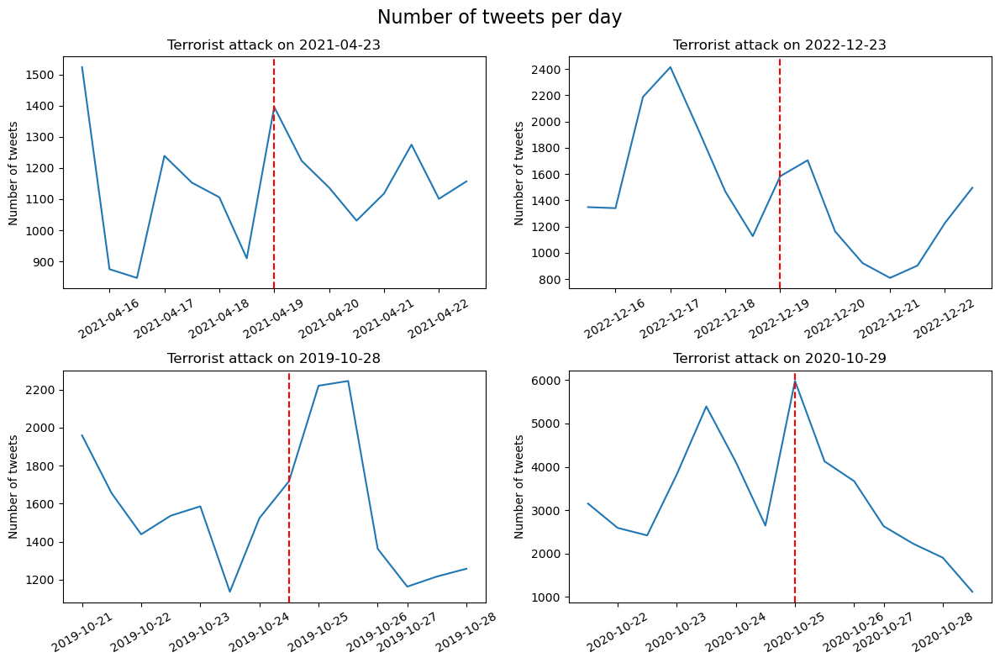

In [ ]:
dates_counts = terror_nodups.groupby(['dataset', 'date'])[['id']].count().reset_index()
dates_counts['attack_date'] = dates_counts['dataset'].apply(date_attack)

# from for different datasets on four different plots, 2 as a row and 2 as a column
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('Number of tweets per day', fontsize=16)
for i, ax in enumerate(axes.flat):
    data_specific = dates_counts[dates_counts['dataset']==dates_counts['dataset'].unique()[i]]
    sns.lineplot(data=data_specific, x='date', y='id', ax=ax)
    ax.set_title(f'Terrorist attack on {dates_counts.attack_date.unique()[i]}')
    ax.set_xlabel('')
    ax.set_ylabel('Number of tweets')
    ax.set_xticklabels(labels=data_specific['date'].unique(), rotation=30)
    ax.axvline(x=dates_counts['attack_date'].unique()[i], color='red', linestyle='--')

plt.tight_layout()


### Sentiment Analysis

First, with dictionary-based VADER.

In [ ]:
from vaderSentiment_fr.vaderSentiment import SentimentIntensityAnalyzer
SIA = SentimentIntensityAnalyzer()

In [ ]:
terror_nodups['sentiment_vader'] = terror_nodups['tokens_merged'].apply(lambda x: SIA.polarity_scores(x)['compound'])

Second, with dictionary-based TextBlob.

In [ ]:
from textblob import Blobber
from textblob_fr import PatternTagger, PatternAnalyzer

tb = Blobber(pos_tagger=PatternTagger(), analyzer=PatternAnalyzer())

In [ ]:
terror_nodups['sentiment_textblob'] = terror_nodups['tokens_merged'].apply(lambda x: tb(x).sentiment[0])

In [ ]:
# correlate the sentiment scores from Vader and TextBlob
terror_nodups[['sentiment_vader', 'sentiment_textblob']].corr()

,sentiment_vader,sentiment_textblob
sentiment_vader,1.000000,0.234886
sentiment_textblob,0.234886,1.000000


Interestingly results seem to have quite weak correlation.

In [ ]:
# transform the sentiment scores into a categorical variable (positive, negative, neutral)
terror_nodups['sentiment_vader_cat'] = terror_nodups['sentiment_vader'].apply(lambda x: 'positive' if x > 0.05 else ('negative' if x < -0.05 else 'neutral'))
terror_nodups['sentiment_textblob_cat'] = terror_nodups['sentiment_textblob'].apply(lambda x: 'positive' if x > 0.05 else ('negative' if x < -0.05 else 'neutral'))

In [ ]:
# show the confusion matrix for Vader and TextBlob with labels
from sklearn.metrics import confusion_matrix
confusion_matrix(terror_nodups['sentiment_vader_cat'], terror_nodups['sentiment_textblob_cat'])

array([[15794, 21806, 23027],
       [ 1406,  7715,  5269],
       [ 3915,  9551, 18053]])

In [ ]:
from sklearn.metrics import accuracy_score
print(f"Accuracy score: {accuracy_score(terror_nodups['sentiment_vader_cat'], terror_nodups['sentiment_textblob_cat'])}")

Accuracy score: 0.3901216490200496


Around 40% of the tweets are classified similarly by both methods.

Now, let's additionally use one embedding-based method.

In [ ]:
!pip install sentencepiece
!pip install transformers>=4.0

from transformers import AutoTokenizer, TFAutoModelForSequenceClassification
from transformers import pipeline

tokenizer = AutoTokenizer.from_pretrained("tblard/tf-allocine", use_fast=True)
model = TFAutoModelForSequenceClassification.from_pretrained("tblard/tf-allocine")

nlp = pipeline('sentiment-analysis', model=model, tokenizer=tokenizer)

: 

: 

In [ ]:
# Takes a lot of time, that's why it is done separately and the results are saved to a csv file. 

from tqdm import tqdm

# sentiment_tf = []

# for i in tqdm(range(terror_nodups.shape[0])):
#  sentiment_tf.append(nlp(str(terror_nodups['tokens_merged'].iloc[i]))[0]['label'].lower())

# terror_nodups['sentiment_tf'] = sentiment_tf

In [ ]:
# after doing sentiment predictions separately
terror_nodups = pd.read_csv(path+'terror_nodups_new.csv.gz', compression='gzip', dtype='str', index_col=0)

In [ ]:
# pre-saving updated data
# terror_nodups.to_csv('terror_nodups_new.csv.gz', compression='gzip')

In [ ]:
terror_nodups.head()

,id,author_id,created_at,edit_history_tweet_ids,lang,in_reply_to_user_id,conversation_id,text,reply_settings,possibly_sensitive,...,tokens_merged,text_stemm,sentiment_tf,text_lemm_merged,attack_date,date,sentiment_vader,sentiment_textblob,sentiment_vader_cat,sentiment_textblob_cat
0,1186334410905391104,2174457974,2019-10-21 17:32:19+00:00,1186334410905391104,fr,2174457974,483909184225046528,"Rappeur à succès,#Lacrim est également un déli...",everyone,True,...,rappeur succès lacrim également délinquant mul...,"['rappeur', 'succes', 'lacrim', 'égal', 'délin...",positive,rappeur succes lacrim delinquant multirecidivi...,2019-10-28,2019-10-21,-0.9254,0.150000,negative,positive
1,1186176998756044801,1089207414623297537,2019-10-21 07:06:49+00:00,1186176998756044801,fr,1104497260371558400,1185880875386454018,@AngeliqueMlt @Kate07203061 @mesopinions_com E...,everyone,False,...,france séparation église démocratie républicai...,"['franc', 'sépar', 'églis', 'démocrat', 'répub...",positive,france separation eglise democratie republicai...,2019-10-28,2019-10-21,-0.4404,0.035000,negative,neutral
2,1186177130536865792,3156965181,2019-10-21 07:07:20+00:00,1186177130536865792,fr,NaN,1186177130536865792,[#TousGamers] Avec les copains de @Capgame_Fra...,everyone,False,...,tousgamers copain lance capgamearena tournoi e...,"['tousgamer', 'copain', 'lanc', 'capgamearen',...",positive,tousgamers copain lance capgamearena tournoi e...,2019-10-28,2019-10-21,0.4404,0.000000,positive,neutral
3,1186177487514025989,983087572472815616,2019-10-21 07:08:45+00:00,1186177487514025989,fr,700044567,1186009340609740802,@FeizaBM Vous les détestez car : elles sont br...,everyone,False,...,détestez car elles brillantes fait étude réuss...,"['détest', 'car', 'elle', 'brill', 'fait', 'ét...",positive,detestez brillantes etude reussi choppe ascens...,2019-10-28,2019-10-21,0.4767,0.232857,positive,positive
4,1186177518497402886,871907797,2019-10-21 07:08:53+00:00,1186177518497402886,fr,871907797,1185977918230536192,@PhMarliere @edwyplenel En plus y a pas que de...,everyone,False,...,plus pas arabe syu portent voile turc aussi fr...,"['plus', 'pas', 'arab', 'syu', 'portent', 'voi...",positive,arabe syu portent voile turc france allez arab...,2019-10-28,2019-10-21,0.7081,0.046250,positive,neutral


##### Combining three methods

If at least two methods agree on the sentiment, we can say that the tweet is classified correctly.

In [ ]:
terror_nodups_positive = terror_nodups[(terror_nodups['sentiment_vader_cat'] == 'positive') & ((terror_nodups['sentiment_textblob_cat'] == 'positive') | (terror_nodups['sentiment_tf'] == 'positive')) | (terror_nodups['sentiment_textblob_cat'] == 'positive') & (terror_nodups['sentiment_tf'] == 'positive')]

In [ ]:
terror_nodups_positive.shape

(40183, 53)

In [ ]:
terror_nodups_negative = terror_nodups[(terror_nodups['sentiment_vader_cat'] == 'negative') & ((terror_nodups['sentiment_textblob_cat'] == 'negative') | (terror_nodups['sentiment_tf'] == 'negative')) | (terror_nodups['sentiment_textblob_cat'] == 'negative') & (terror_nodups['sentiment_tf'] == 'negative')]

In [ ]:
terror_nodups_negative.shape

(41271, 53)

In [ ]:
all_counts = terror_nodups[['dataset', 'date']].drop_duplicates().reset_index(drop=True)
# merge the positive and negative sentiment dataframes with the all_counts dataframe
all_counts = all_counts.merge(terror_nodups_positive.groupby(['dataset', 'date'])['id'].count().reset_index(), how='left', on=['dataset', 'date'])
all_counts = all_counts.merge(terror_nodups_negative.groupby(['dataset', 'date'])['id'].count().reset_index(), how='left', on=['dataset', 'date'], suffixes=('_positive', '_negative'))
all_counts = all_counts.merge(terror_nodups.groupby(['dataset', 'date'])['id'].count().reset_index(), how='left', on=['dataset', 'date'])

all_counts['positive_perc'] = all_counts['id_positive']/all_counts['id']
all_counts['negative_perc'] = all_counts['id_negative']/all_counts['id']

all_counts.sort_values(by='date', inplace=True)
all_counts.reset_index(drop=True, inplace=True)

In [ ]:
all_counts['attack_date'] = all_counts['dataset'].apply(date_attack)
all_counts['time'] = all_counts['date'] - all_counts['attack_date']
all_counts['time'] = all_counts['time'].dt.days

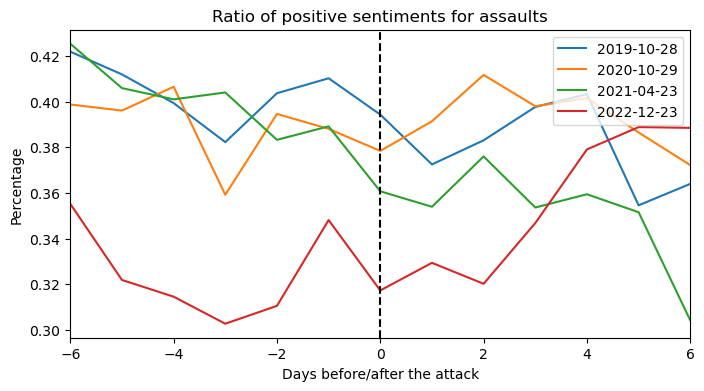

In [ ]:
plt.figure(figsize=(8,4))

for dataset in all_counts['dataset'].unique():
    # plot the lineplot of positive sentiment percentages for each dataset over time on the same plot
    sns.lineplot(data=all_counts[all_counts['dataset'] == dataset], x='time', y='positive_perc', label=f'{all_counts[ all_counts["dataset"] == dataset]["attack_date"].unique()[0]}')
    plt.xlabel('Days before/after the attack')


plt.title('Ratio of positive sentiments for assaults')
    
plt.ylabel('Percentage')
plt.legend(loc='upper right')
plt.xlim(all_counts['time'].min() + 1, all_counts['time'].max() - 1)
plt.axvline(x=0, color='black', linestyle='--')

#plt.savefig(path+'positive_sentiments.png', dpi=300)
plt.show()

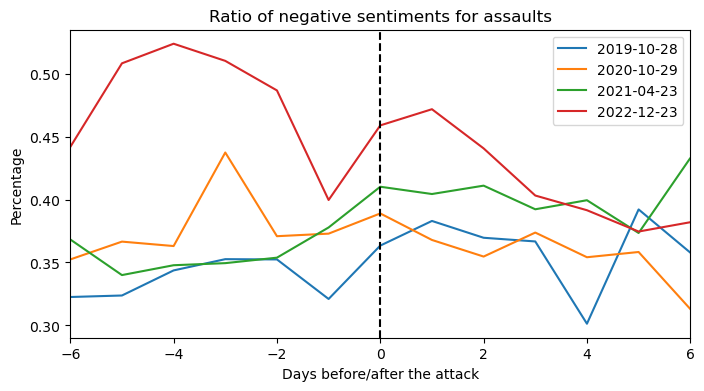

In [ ]:
plt.figure(figsize=(8,4))

for dataset in all_counts['dataset'].unique():
    # plot the lineplot of negative sentiment percentages for each dataset over time on the same plot
    sns.lineplot(data=all_counts[all_counts['dataset'] == dataset], x='time', y='negative_perc', label=f'{all_counts[ all_counts["dataset"] == dataset]["attack_date"].unique()[0]}')
    plt.xlabel('Days before/after the attack')


plt.title('Ratio of negative sentiments for assaults')
    
plt.ylabel('Percentage')
plt.legend(loc='upper right')
plt.xlim(all_counts['time'].min() + 1, all_counts['time'].max() - 1)
plt.axvline(x=0, color='black', linestyle='--')

#plt.savefig(path+'negative_sentiments.png', dpi=300)
plt.show()

### Wordclouds for sentiments

In [ ]:
from wordcloud import WordCloud
from collections import defaultdict
from nltk.probability import FreqDist

##### Negative

In [ ]:
# Grouping of negative tweets
corpus_1 = terror_nodups_negative['text_lemm_merged'].tolist()

# Creation of a list that contains all the words
words_1 = ' '.join(corpus_1)
word_list_1 = re.findall(r"\w+", words_1)
print(f"List of words present in our corpus : \n{word_list_1[:10]}\n")

List of words present in our corpus : 
['france', 'inter', 'radio', 'gauche', 'invite', 'gauche', 'extreme', 'gauche', 'probleme', 'amp']



In [ ]:
vocab_n_tweets = set(word_list_1)
print(f"The lenght of our vocabulary is {len(vocab_n_tweets)}")

The lenght of our vocabulary is 34405


In [ ]:
# Let's determine the frequence of each word
freq_1 = defaultdict(int) # Dictionary initialization

# Counts the occurrence of each word in the corpus
for word in word_list_1:
    freq_1[word] += 1

freq_dict = FreqDist(word_list_1)

In [ ]:
# sort the dictionary in descending order by frequency
sorted_dict = sorted(freq_dict.items(), key=lambda x: x[1], reverse=True)

# get the 15 most frequent words
top_words = [word[0] for word in sorted_dict[:15]]

# create a new dictionary excluding the top twenty words
new_dict = {word: freq_dict[word] for word in freq_dict if word not in top_words}

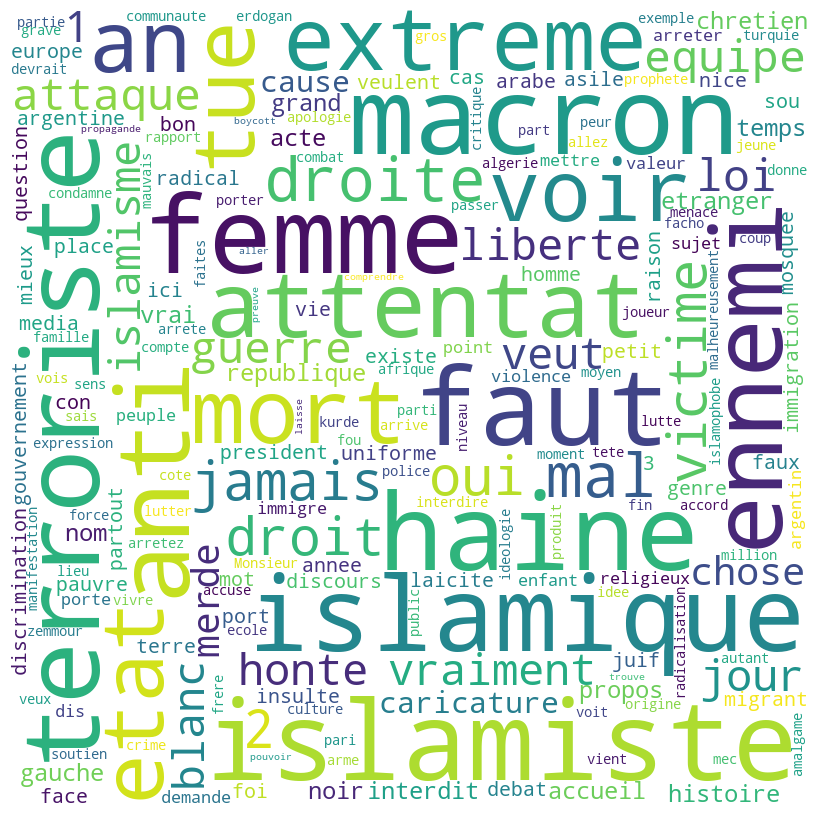

In [ ]:
# using freq_dict plot a word cloud
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10,
                max_font_size = 110,
                collocations=True).generate_from_frequencies(new_dict)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

#plt.savefig(path+'wordcloud_negative_tweets.png', dpi=300)
plt.show()

##### Positive

In [ ]:
# Grouping of positive tweets
corpus_2 = terror_nodups_positive['text_lemm_merged'].tolist()

# Creation of a list that contains all the words
words_2 = ' '.join(corpus_2)
word_list_2 = re.findall(r"\w+", words_2)
print(f"List of words present in our corpus : \n{word_list_2[:10]}\n")

List of words present in our corpus : 
['rappeur', 'succes', 'lacrim', 'delinquant', 'multirecidiviste', 'effectue', 'passage', 'prison', '2001', '2002']



In [ ]:
# list of unique words in our vocabulary
vocab_p_tweets = set(word_list_2)
print(f"The lenght of our vocabulary is {len(vocab_p_tweets)}")

The lenght of our vocabulary is 38105


In [ ]:
# Let's determine the frequence of each word

freq_2 = defaultdict(int) # Dictionary initialization

# Counts the occurrence of each word in the corpus
for word in word_list_2:
    freq_2[word] += 1

freq_dict2 = FreqDist(word_list_2)

# sort the dictionary in descending order by frequency
sorted_dict2 = sorted(freq_dict2.items(), key=lambda x: x[1], reverse=True)

# get the 15 most frequent words
top_words2 = [word[0] for word in sorted_dict2[:15]]

# create a new dictionary excluding the top twenty words
new_dict2 = {word: freq_dict2[word] for word in freq_dict2 if word not in top_words2}


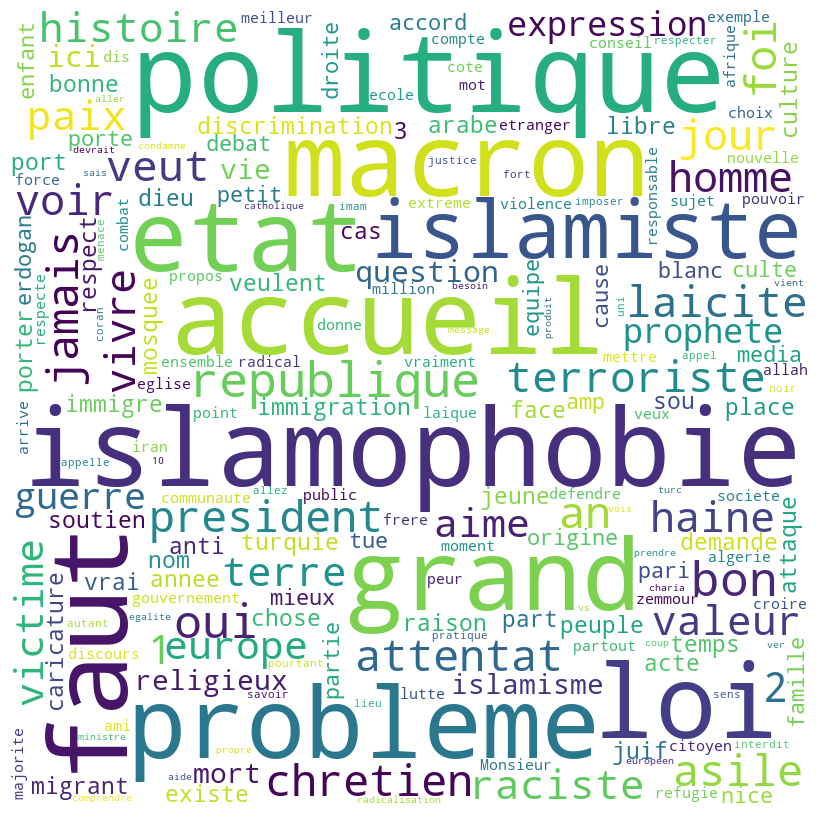

In [ ]:
# using freq_dict plot a word cloud
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10,
                max_font_size = 110,
                collocations=True).generate_from_frequencies(new_dict2)

# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

#plt.savefig(path+'wordcloud_positive_tweets.png', dpi=300)
plt.show()

In [ ]:
words = list(set(list(freq_dict.keys()) + list(freq_dict2.keys())))

In [ ]:
threshold = 1000
differences = []
for word in words:
    if (word in freq_dict and freq_dict2[word] < threshold and word in freq_dict2) \
        or (word in freq_dict2 and freq_dict2[word] < threshold and word in freq_dict):
        difference = freq_dict2.get(word, 0) - freq_dict.get(word, 0)
        differences.append((word, difference))

differences.sort(key=lambda x: x[1], reverse=True)

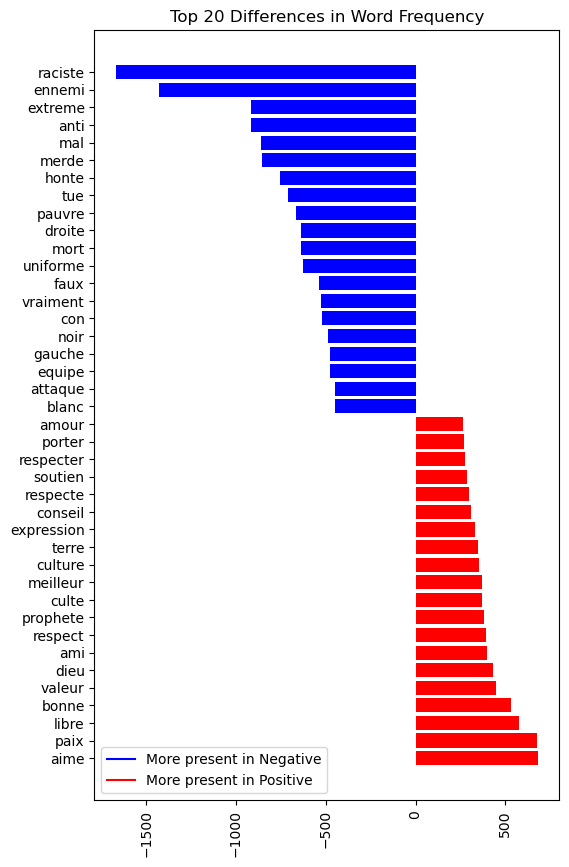

In [ ]:
# Plot top n differences
n = 20
plt.figure(figsize=(6, 10))
labels = [diff[0] for diff in (differences[:n] + differences[-n:])]
values = [diff[1] for diff in (differences[:n] + differences[-n:])]
colors = ['blue' if v < 0 else 'red' for v in values]
plt.barh(labels, values, color=colors)
plt.xticks(rotation=90)
plt.title('Top 20 Differences in Word Frequency')
negative_patch = plt.plot([],[], color='blue', label='More present in Negative')[0]
positive_patch = plt.plot([],[], color='red', label='More present in Positive')[0]
plt.legend(handles=[negative_patch, positive_patch], loc='best')
plt.show()

### Manual Annotations and Prediction of Ideology

We manually annotated 1400 randomly selected tweets by sentiment (positive, negaive, neutral) and ideology (left, neutral, right).

In [ ]:
terror_grading = pd.read_csv(path+'terror_grading.csv', dtype='str', index_col=0)
terror_grading = terror_grading.reset_index()

terror_grading['text'] = terror_grading['text'].astype(str)
terror_grading['tokens_merged'] = terror_grading['tokens_merged'].astype(str)
terror_grading['text_tokenized'] = terror_grading['text'].apply(clean_twitter_token)
terror_grading['text_lemmitized'] = terror_grading['text_tokenized'].apply(lemmitized_text)
terror_grading['tokens_merged'] = terror_grading['text_lemmitized'].apply(lambda x: ' '.join(x))
terror_grading['text_stemm'] = terror_grading['text_tokenized'].apply(stemming_text)


In [ ]:
terror_grading.head()

,index,id,author_id,created_at,text,sentiment,ideology,text_tokenized,text_lemmitized,tokens_merged,text_stemm,is_ideological,is_right
0,0,1.3838805399673446e+18,2677366932,2021-04-18 20:30:06+00:00,@AlexVilp @dupontaignan Et l'impunité de la fl...,negative,left,"['impunité', 'flicaille', 'assassine', '47', '...","['impunité', 'flicaille', 'assassine', '47', '...",impunité flicaille assassine 47 innocent sans ...,"['impun', 'flicaill', 'assassin', '47', 'innoc...",1,0
1,1,1.6078543358574264e+18,1537825543885795330,2022-12-27 21:42:00+00:00,"RT @Tii_ech: @taetaeluvm #MohammadMoradi, un é...",negative,left,"['mohammadmoradi', 'étudiant', 'iranien', 'viv...","['mohammadmoradi', 'étudiant', 'iranien', 'viv...",mohammadmoradi étudiant iranien vivant france ...,"['mohammadmorad', 'étudi', 'iranien', 'viv', '...",1,0
2,2,1.3225902054052577e+18,416409165,2020-10-31 17:24:12+00:00,@Fraoui1983 @JudithBernarADA @briceculturier @...,negative,left,"['merci', 'retweet', 'propos', 'cette', 'femme...","['merci', 'retweet', 'propos', 'cette', 'femme...",merci retweet propos cette femme hallucinants ...,"['merc', 'retweet', 'propos', 'cet', 'femm', '...",1,0
3,3,1.320737837088678e+18,766411072249204736,2020-10-26 14:43:33+00:00,Le voile a jamais tué personne en France c’est...,negative,left,"['voile', 'jamais', 'tué', 'personne', 'france...","['voile', 'jamais', 'tué', 'personne', 'france...",voile jamais tué personne france grave acharne...,"['voil', 'jam', 'tu', 'person', 'franc', 'grav...",1,0
4,4,1.3193494538332529e+18,2693196473,2020-10-22 18:46:36+00:00,@OlivierBenis @Alkanz Il faut un brassard à la...,negative,left,"['faut', 'brassard', 'lavant', 'bras', 'musulm...","['faut', 'brassard', 'lavant', 'bras', 'musulm...",faut brassard lavant bras musulman france dist...,"['faut', 'brassard', 'lav', 'bras', 'musulman'...",1,0


In [ ]:
# ideological training
terror_grading['is_ideological'] = terror_grading['ideology'].map({'right': 1, 'left': 1, 'neutral': 0})
terror_grading['is_right'] = terror_grading['ideology'].map({'right': 1, 'left': 0, 'neutral': 0})

In [ ]:
!git clone https://github.com/rubingshen/AugmentedSocialScientist.git
!pip install ./AugmentedSocialScientist/package/

from AugmentedSocialScientist import xlmroberta
from transformers import XLMRobertaForTokenClassification

Cloning into 'AugmentedSocialScientist'...
remote: Enumerating objects: 134, done.
remote: Counting objects: 100% (99/99), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 134 (delta 36), reused 50 (delta 13), pack-reused 35
Receiving objects: 100% (134/134), 1.68 MiB | 22.91 MiB/s, done.
Resolving deltas: 100% (46/46), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./AugmentedSocialScientist/package
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 65.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 117.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 72.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 KB 54.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 KB 5.9 MB/

In [ ]:
data_train, data_test = xlmroberta.train_test_split(terror_grading, test_size=0.2, random_state=42, stratify=terror_grading['is_ideological'])

In [ ]:
train_loader = xlmroberta.encode(data_train.text.values, data_train.is_ideological.values)
test_loader = xlmroberta.encode(data_test.text.values, data_test.is_ideological.values)

  0%|          | 0/1120 [00:00<?, ?it/s]

  0%|          | 0/1120 [00:00<?, ?it/s]

  0%|          | 0/280 [00:00<?, ?it/s]

  0%|          | 0/280 [00:00<?, ?it/s]

In [ ]:
len(train_loader)

35

In [ ]:
score = xlmroberta.run_training(train_loader, 
                         test_loader, 
                         n_epochs=6, 
                         lr=5e-5, 
                         seed_val=42,
                         save_model_as='is_ideological')

Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias', 'roberta.pooler.dense.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.bias']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.out_p


======== Epoch 1 / 6 ========
Training...

  Average training loss: 0.67
  Training took: 0:00:30

Running Validation...

  Average test loss: 0.67
  Validation took: 0:00:03
              precision    recall  f1-score   support

           0       0.59      0.12      0.21       104
           1       0.65      0.95      0.77       176

    accuracy                           0.64       280
   macro avg       0.62      0.54      0.49       280
weighted avg       0.63      0.64      0.56       280


======== Epoch 2 / 6 ========
Training...

  Average training loss: 0.65
  Training took: 0:00:31

Running Validation...

  Average test loss: 0.62
  Validation took: 0:00:03
              precision    recall  f1-score   support

           0       0.63      0.33      0.43       104
           1       0.69      0.89      0.78       176

    accuracy                           0.68       280
   macro avg       0.66      0.61      0.60       280
weighted avg       0.67      0.68      0.65      

In [ ]:
pred_loader = xlmroberta.encode(terror_nodups.text.values)

  0%|          | 0/106535 [00:00<?, ?it/s]

  0%|          | 0/106535 [00:00<?, ?it/s]

In [ ]:
pred_proba = xlmroberta.predict_with_model(pred_loader, model_path='/content/drive/MyDrive/digitalspace data/is_ideological')

  0%|          | 0/3330 [00:00<?, ?it/s]

In [ ]:
pred_proba = pd.DataFrame(pred_proba, columns=['not_ideological', 'ideological'])

In [ ]:
terror_nodups = pd.concat([terror_nodups, pred_proba], axis = 1)

In [ ]:
terror_nodups

,id,author_id,created_at,edit_history_tweet_ids,lang,in_reply_to_user_id,conversation_id,text,reply_settings,possibly_sensitive,...,sentiment_tf,text_lemm_merged,attack_date,date,sentiment_vader,sentiment_textblob,sentiment_vader_cat,sentiment_textblob_cat,not_ideological,ideological
0,1186334410905391104,2174457974,2019-10-21 17:32:19+00:00,1186334410905391104,fr,2174457974,483909184225046528,"Rappeur à succès,#Lacrim est également un déli...",everyone,True,...,positive,rappeur succes lacrim delinquant multirecidivi...,2019-10-28,2019-10-21,-0.9254,0.15000000000000002,negative,positive,0.664320,0.335680
1,1186176998756044801,1089207414623297537,2019-10-21 07:06:49+00:00,1186176998756044801,fr,1104497260371558400,1185880875386454018,@AngeliqueMlt @Kate07203061 @mesopinions_com E...,everyone,False,...,positive,france separation eglise democratie republicai...,2019-10-28,2019-10-21,-0.4404,0.035,negative,neutral,0.194920,0.805080
2,1186177130536865792,3156965181,2019-10-21 07:07:20+00:00,1186177130536865792,fr,NaN,1186177130536865792,[#TousGamers] Avec les copains de @Capgame_Fra...,everyone,False,...,positive,tousgamers copain lance capgamearena tournoi e...,2019-10-28,2019-10-21,0.4404,0.0,positive,neutral,0.664562,0.335438
3,1186177487514025989,983087572472815616,2019-10-21 07:08:45+00:00,1186177487514025989,fr,700044567,1186009340609740802,@FeizaBM Vous les détestez car : elles sont br...,everyone,False,...,positive,detestez brillantes etude reussi choppe ascens...,2019-10-28,2019-10-21,0.4767,0.23285714285714285,positive,positive,0.182029,0.817971
4,1186177518497402886,871907797,2019-10-21 07:08:53+00:00,1186177518497402886,fr,871907797,1185977918230536192,@PhMarliere @edwyplenel En plus y a pas que de...,everyone,False,...,positive,arabe syu portent voile turc france allez arab...,2019-10-28,2019-10-21,0.7081,0.04625,positive,neutral,0.180907,0.819093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106530,1608779710502424576,3620711957,2022-12-30 10:59:07+00:00,1608779710502424576,fr,898203557060542464,1608769409786728448,@firstjour2 @jaiunefemme @DamienRieu Le voile ...,everyone,False,...,positive,voile autorisee france,2022-12-23,2022-12-30,0.0,0.05,neutral,neutral,0.292214,0.707786
106531,1608779570773397506,1596817523130961921,2022-12-30 10:58:34+00:00,1608779570773397506,fr,898203557060542464,1608769409786728448,@firstjour2 @YRozier37 @DamienRieu La France n...,everyone,False,...,negative,france interdit voile loi tais niche,2022-12-23,2022-12-30,-0.4215,0.0,negative,neutral,0.196117,0.803883
106532,1608779449771888643,614980351,2022-12-30 10:58:05+00:00,1608779449771888643,fr,100004577,1608779449771888643,"@Orange_France bonjour, j’ai téléphoné à votre...",everyone,False,...,negative,bonjour telephone ligne 3900 changer mobile ac...,2022-12-23,2022-12-30,-0.5739,-0.28125,negative,negative,0.214223,0.785777
106533,1608780643999309825,1562402164911521794,2022-12-30 11:02:49+00:00,1608780643999309825,fr,978184280,1608769409786728448,"@DamienRieu ""Du vélo"" mdr sans voile mdr dans ...",everyone,False,...,negative,velo mdr voile mdr pays mdr france remettent f...,2022-12-23,2022-12-30,0.8539,0.0,positive,neutral,0.178309,0.821691


In [ ]:
terror_nodups.to_csv(path+'terror_nodups_ideology.csv.gz', compression='gzip')

Now let's try again with right/left

In [ ]:
data_train, data_test = xlmroberta.train_test_split(terror_grading, test_size=0.2, random_state=42, stratify=terror_grading['is_right'])

In [ ]:
train_loader = xlmroberta.encode(data_train.text.values, data_train.is_right.values, batch_size=10)
test_loader = xlmroberta.encode(data_test.text.values, data_test.is_right.values, batch_size=10)

  0%|          | 0/1120 [00:00<?, ?it/s]

  0%|          | 0/1120 [00:00<?, ?it/s]

  0%|          | 0/280 [00:00<?, ?it/s]

  0%|          | 0/280 [00:00<?, ?it/s]

In [ ]:
score = xlmroberta.run_training(train_loader, 
                         test_loader, 
                         n_epochs=7, 
                         lr=5e-5, 
                         seed_val=42,
                         save_model_as='is_right')

Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.dense.weight', 'roberta.pooler.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.out_p


======== Epoch 1 / 4 ========
Training...
  Batch    40  of    112.    Elapsed: 0:00:15.
  Batch    80  of    112.    Elapsed: 0:00:27.

  Average training loss: 0.67
  Training took: 0:00:37

Running Validation...

  Average test loss: 0.74
  Validation took: 0:00:02
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       179
           1       0.36      1.00      0.53       101

    accuracy                           0.36       280
   macro avg       0.18      0.50      0.27       280
weighted avg       0.13      0.36      0.19       280


======== Epoch 2 / 4 ========
Training...
  Batch    40  of    112.    Elapsed: 0:00:13.
  Batch    80  of    112.    Elapsed: 0:00:26.

  Average training loss: 0.67
  Training took: 0:00:37

Running Validation...

  Average test loss: 0.66
  Validation took: 0:00:02
              precision    recall  f1-score   support

           0       0.64      1.00      0.78       179
           1       0.00 

Trying to improve the results with a more balanced dataset.

In [ ]:
from sklearn.utils import resample

# Separate the data into two classes
class_0 = terror_grading[terror_grading['is_right']==0]
class_1 = terror_grading[terror_grading['is_right']==1]

# Calculate the size of the minority class
minority_size = len(class_1)


class_1_upsampled = resample(class_1, 
                             replace=True,    # Sample with replacement
                             n_samples=len(class_0),    # Match majority class size
                             random_state=42) # Set random state for reproducibility



In [ ]:
# Combine the upsampled minority class with the majority class
upsampled = pd.concat([class_0, class_1_upsampled])

# Shuffle the upsampled data
upsampled = upsampled.sample(frac=1, random_state=42)

In [ ]:
upsampled = upsampled.reset_index(drop=True)

In [ ]:
upsampled.is_right.value_counts()

1    894
0    894
Name: is_right, dtype: int64

In [ ]:
data_train, data_test = xlmroberta.train_test_split(upsampled, test_size=0.2, random_state=42, stratify=upsampled['is_right'])

In [ ]:
train_loader = xlmroberta.encode(data_train.text.values, data_train.is_right.values, batch_size=12)
test_loader = xlmroberta.encode(data_test.text.values, data_test.is_right.values, batch_size=12)

  0%|          | 0/1430 [00:00<?, ?it/s]

  0%|          | 0/1430 [00:00<?, ?it/s]

  0%|          | 0/358 [00:00<?, ?it/s]

  0%|          | 0/358 [00:00<?, ?it/s]

In [ ]:
score = xlmroberta.run_training(train_loader, 
                         test_loader, 
                         n_epochs=20, 
                         lr=5e-5, 
                         seed_val=42,
                         save_model_as='is_right')

Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.dense.weight', 'roberta.pooler.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'roberta.pooler.dense.bias', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.out_p


======== Epoch 1 / 20 ========
Training...
  Batch    40  of    120.    Elapsed: 0:00:16.
  Batch    80  of    120.    Elapsed: 0:00:31.

  Average training loss: 0.70
  Training took: 0:00:46

Running Validation...

  Average test loss: 0.69
  Validation took: 0:00:03
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       179
           1       0.50      1.00      0.67       179

    accuracy                           0.50       358
   macro avg       0.25      0.50      0.33       358
weighted avg       0.25      0.50      0.33       358


======== Epoch 2 / 20 ========
Training...
  Batch    40  of    120.    Elapsed: 0:00:15.
  Batch    80  of    120.    Elapsed: 0:00:30.

  Average training loss: 0.70
  Training took: 0:00:45

Running Validation...

  Average test loss: 0.69
  Validation took: 0:00:03
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       179
           1       0.5

The same issue: the model always predicts only one class.

### Frequency and Wordclouds for ideology

In [ ]:
terror_nodups = pd.read_csv(path+'terror_nodups_ideology.csv.gz', compression='gzip', index_col=0)

In [ ]:
# assign 1 to ideology of ideological column in > 0.5
terror_nodups['is_ideological'] = terror_nodups['ideological'].apply(lambda x: 1 if x > 0.50 else (0 if x < 0.50 else np.nan))
terror_nodups['is_ideological'].value_counts()

1    87695
0    18840
Name: is_ideological, dtype: int64

In [ ]:
all_counts = terror_nodups.groupby(['dataset', 'date', 'is_ideological']).size().unstack().reset_index()
all_counts['total'] = all_counts[0] + all_counts[1]
all_counts['ideology_ratio'] = all_counts[1] / all_counts['total']
all_counts['attack_date'] = all_counts['dataset'].apply(date_attack)
all_counts['attack_date'] = pd.to_datetime(all_counts['attack_date'])
all_counts['attack_date'] = all_counts['attack_date'].dt.date
all_counts['date'] = pd.to_datetime(all_counts['date'])
all_counts['date'] = all_counts['date'].dt.date
all_counts['time'] = all_counts['date'] - all_counts['attack_date']
all_counts['time'] = all_counts['time'].dt.days

all_counts.sort_values(by=['attack_date'], inplace=True)

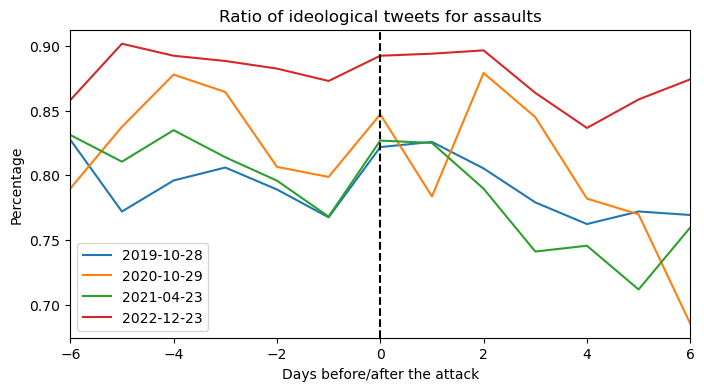

In [ ]:
plt.figure(figsize=(8,4))

for dataset in all_counts['dataset'].unique():
    # plot the lineplot of positive sentiment percentages for each dataset over time on the same plot
    sns.lineplot(data=all_counts[all_counts['dataset'] == dataset], x='time', y='ideology_ratio', label=f'{all_counts[ all_counts["dataset"] == dataset]["attack_date"].unique()[0]}')
    plt.xlabel('Days before/after the attack')


plt.title('Ratio of ideological tweets for assaults')
    
plt.ylabel('Percentage')
plt.legend(loc='best')
plt.xlim(all_counts['time'].min() + 1, all_counts['time'].max() - 1)
plt.axvline(x=0, color='black', linestyle='--')

#plt.savefig(path+'positive_sentiments.png', dpi=300)
plt.show()

##### Ideological

In [ ]:
# Grouping of ideological tweets
corpus_3 = terror_nodups[terror_nodups['is_ideological']==1]['text_lemm_merged'].tolist()

# Creation of a list that contains all the words
words_3 = ' '.join(corpus_3)
word_list_3 = re.findall(r"\w+", words_3)
print(f"List of words present in our corpus : \n{word_list_3[:10]}\n")

List of words present in our corpus : 
['france', 'separation', 'eglise', 'democratie', 'republicain', 'musulman', 'faut', 'separer', 'mosquee', 'vivre']



In [ ]:
vocab_n_tweets = set(word_list_3)
print(f"The lenght of our vocabulary is {len(vocab_n_tweets)}")

The lenght of our vocabulary is 52357


In [ ]:
# Let's determine the frequence of each word
freq_3 = defaultdict(int) # Dictionary initialization

# Counts the occurrence of each word in the corpus
for word in word_list_3:
    freq_3[word] += 1

freq_dict3 = FreqDist(word_list_3)
# sort the dictionary in descending order by frequency
sorted_dict = sorted(freq_dict3.items(), key=lambda x: x[1], reverse=True)

# get the 15 most frequent words
top_words = [word[0] for word in sorted_dict[:15]]

# create a new dictionary excluding the top twenty words
new_dict = {word: freq_dict3[word] for word in freq_dict3 if word not in top_words}
# using freq_dict plot a word cloud
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10,
                max_font_size = 110,
                collocations=True).generate_from_frequencies(new_dict)

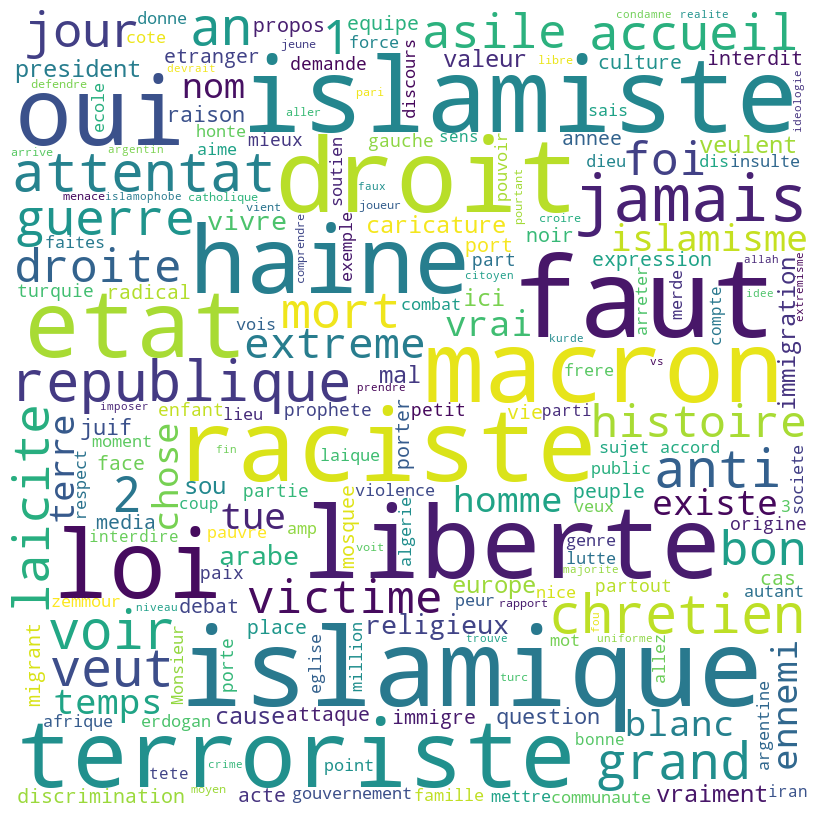

In [ ]:
# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

#plt.savefig(path+'wordcloud_negative_tweets.png', dpi=300)
plt.show()

##### Non-ideological

In [ ]:
# Grouping of ideological tweets
corpus_4 = terror_nodups[terror_nodups['is_ideological']==0]['text_lemm_merged'].dropna().tolist()

# Creation of a list that contains all the words
words_4 = ' '.join(corpus_4)
word_list_4 = re.findall(r"\w+", words_4)
print(f"List of words present in our corpus : \n{word_list_4[:10]}\n")

List of words present in our corpus : 
['rappeur', 'succes', 'lacrim', 'delinquant', 'multirecidiviste', 'effectue', 'passage', 'prison', '2001', '2002']



In [ ]:
vocab_n_tweets = set(word_list_4)
print(f"The lenght of our vocabulary is {len(vocab_n_tweets)}")

The lenght of our vocabulary is 23252


In [ ]:
# Let's determine the frequence of each word
freq_4 = defaultdict(int) # Dictionary initialization

# Counts the occurrence of each word in the corpus
for word in word_list_4:
    freq_4[word] += 1

freq_dict4 = FreqDist(word_list_4)
# sort the dictionary in descending order by frequency
sorted_dict = sorted(freq_dict4.items(), key=lambda x: x[1], reverse=True)

# get the 15 most frequent words
top_words = [word[0] for word in sorted_dict[:15]]

# create a new dictionary excluding the top twenty words
new_dict = {word: freq_dict4[word] for word in freq_dict4 if word not in top_words}
# using freq_dict plot a word cloud
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10,
                max_font_size = 110,
                collocations=True).generate_from_frequencies(new_dict)

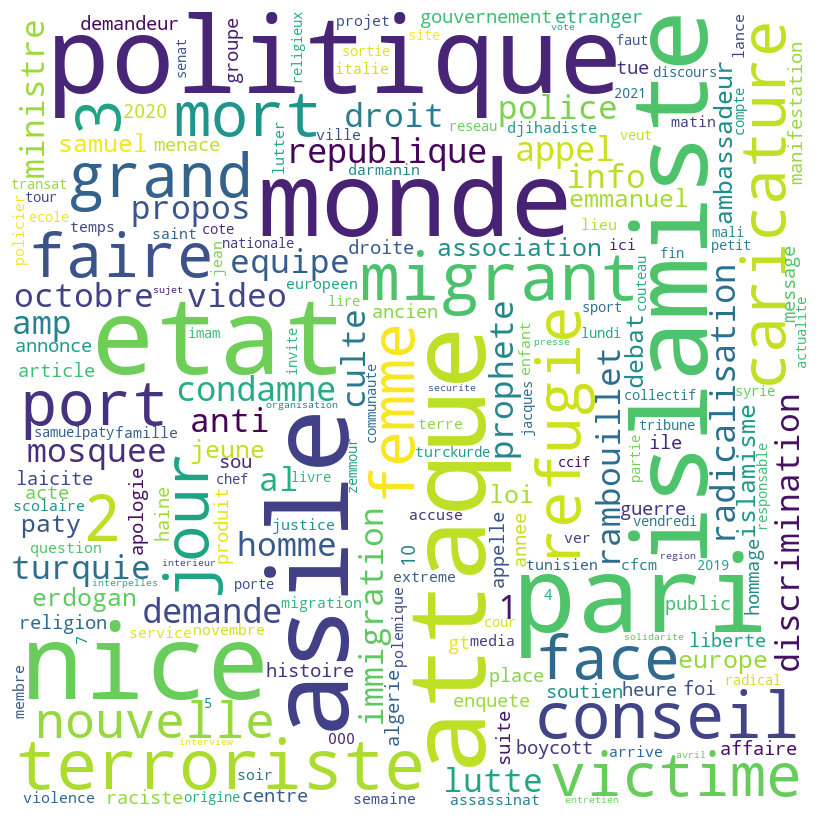

In [ ]:
# plot the WordCloud image
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

#plt.savefig(path+'wordcloud_negative_tweets.png', dpi=300)
plt.show()

##### Words that are more among ideological and among non-ideological tweets

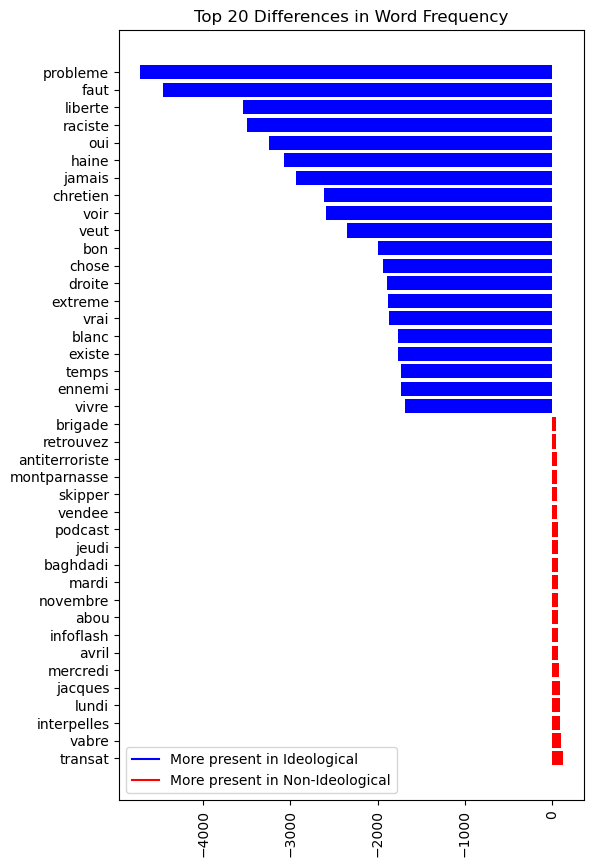

In [ ]:
words = list(set(list(freq_dict3.keys()) + list(freq_dict4.keys())))

threshold = 200
differences = []
for word in words:
    if (word in freq_dict3 and freq_dict4[word] < threshold and word in freq_dict4) \
        or (word in freq_dict4 and freq_dict4[word] < threshold and word in freq_dict3):
        difference = freq_dict4.get(word, 0) - freq_dict3.get(word, 0)
        differences.append((word, difference))

differences.sort(key=lambda x: x[1], reverse=True)
# Plot top n differences
n = 20
plt.figure(figsize=(6, 10))
labels = [diff[0] for diff in (differences[:n] + differences[-n:])]
values = [diff[1] for diff in (differences[:n] + differences[-n:])]
colors = ['blue' if v < 0 else 'red' for v in values]
plt.barh(labels, values, color=colors)
plt.xticks(rotation=90)
plt.title('Top 20 Differences in Word Frequency')
negative_patch = plt.plot([],[], color='blue', label='More present in Ideological')[0]
positive_patch = plt.plot([],[], color='red', label='More present in Non-Ideological')[0]
plt.legend(handles=[negative_patch, positive_patch], loc='best')
plt.show()

### Networks of Hashtags

In [ ]:
import networkx as nx
import datetime
from sklearn.preprocessing import MinMaxScaler

In [ ]:
hashtags_data = terror_nodups[['hashtags', 'created_at', 'dataset']].dropna().reset_index(drop=True)

hashtags_data.created_at = pd.to_datetime(hashtags_data.created_at)
hashtags_data.created_at = hashtags_data.created_at.dt.date

hashtags_data['hashtags'] = hashtags_data['hashtags'].apply(lambda x: x.split(' '))

In [ ]:
edges = []
for i in range(len(hashtags_data)):
    if len(hashtags_data.hashtags[i]) > 1:
        for j in range(len(hashtags_data.hashtags[i])):
            for k in range(j+1, len(hashtags_data.hashtags[i])):
                edges.append((hashtags_data.hashtags[i][j], hashtags_data.hashtags[i][k], hashtags_data.created_at[i], hashtags_data.dataset[i]))

# from edges to dataframe 
edges_df = pd.DataFrame(edges, columns=['hashtag1', 'hashtag2', 'date', 'dataset'])

# add value counts to edges_df
edges_df['count'] = edges_df.groupby(['hashtag1', 'hashtag2', 'date', 'dataset'])['hashtag1'].transform('count')

edges_df['hashtag1'] = edges_df['hashtag1'].apply(lambda x: x.lower())
edges_df['hashtag2'] = edges_df['hashtag2'].apply(lambda x: x.lower())

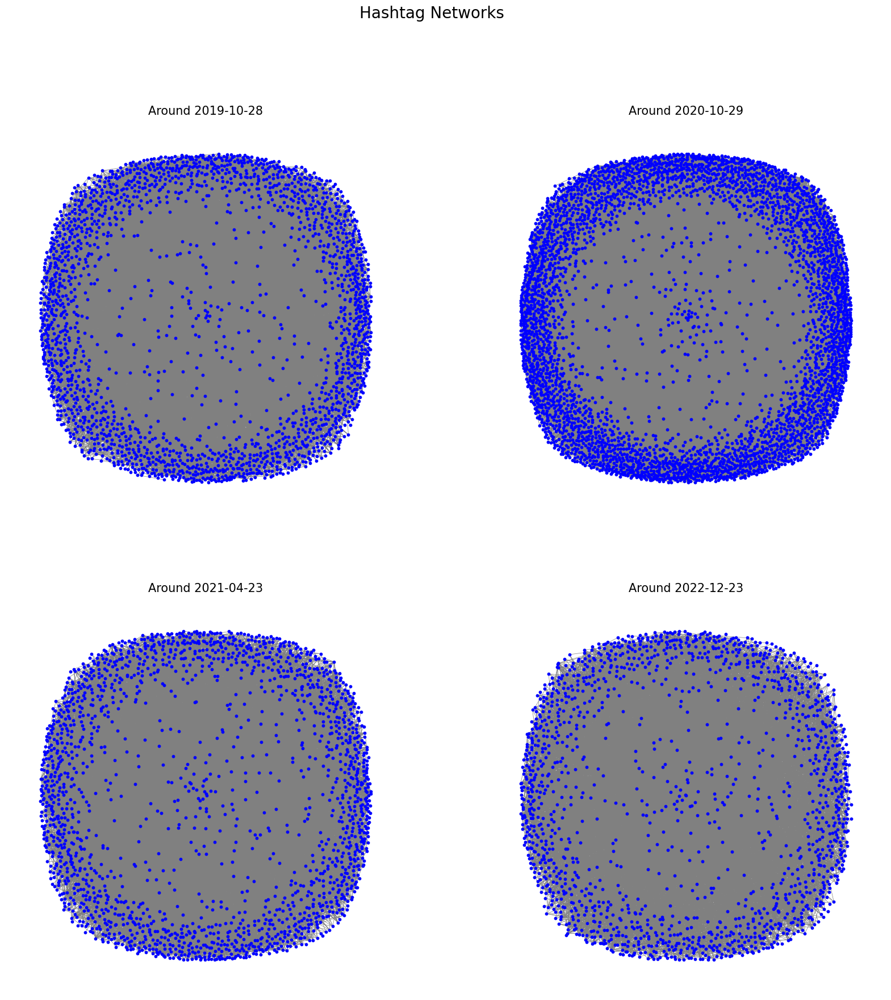

In [ ]:
# plot the graph for each dataset separately using subplots 2x2
fig, ax = plt.subplots(2, 2, figsize=(20, 20))
fig.suptitle('Hashtag Networks', fontsize=20)

dates = [datetime.date(2022, 12, 23), datetime.date(2021, 4, 23), datetime.date(2020, 10, 29), datetime.date(2019, 10, 28)]
dates.sort()
dict_title = {'terror281019': f'Around {dates[0]}', 'terror291020': f'Around {dates[1]}', 'terror230421': f'Around {dates[2]}', 'terror231222': f'Around {dates[3]}'}


# plot the graph for each dataset separately using subplots 2x2
for i, dataset in enumerate(edges_df.dataset.unique()):
    edges_df_dataset = edges_df[edges_df.dataset == dataset]
    G = nx.from_pandas_edgelist(edges_df_dataset, 'hashtag1', 'hashtag2', ['count', 'date', 'dataset'], create_using=nx.Graph())
    G.remove_edges_from(nx.selfloop_edges(G))
    Gcc = sorted(nx.connected_components(G), key=len, reverse=True)
    G_cc = G.subgraph(Gcc[0])
    pos = nx.spring_layout(G_cc, k=0.5, iterations=20)
    nx.draw(G_cc, pos, node_size=10, node_color='blue', edge_color='grey', width=0.5, ax=ax[i//2, i%2])
    ax[i//2, i%2].set_title(dict_title[f'{dataset}'], fontsize=15)

plt.show()


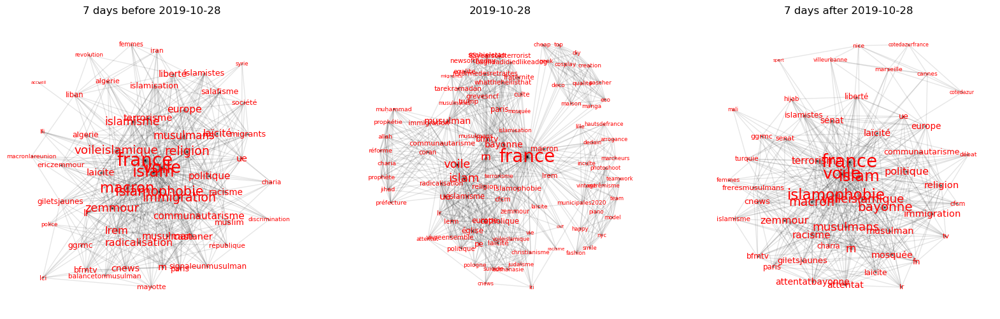

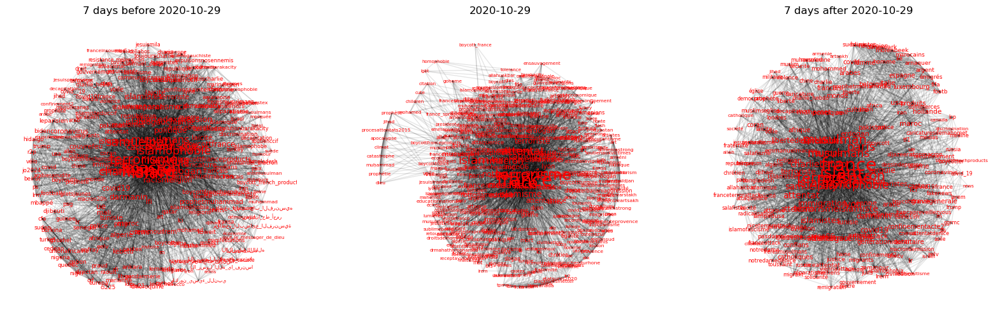

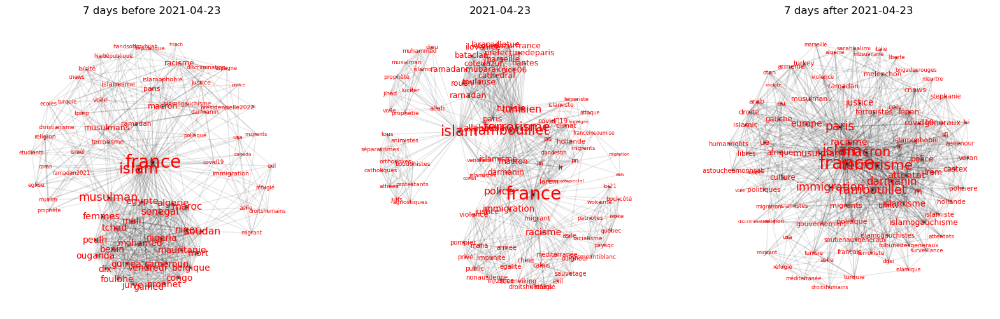

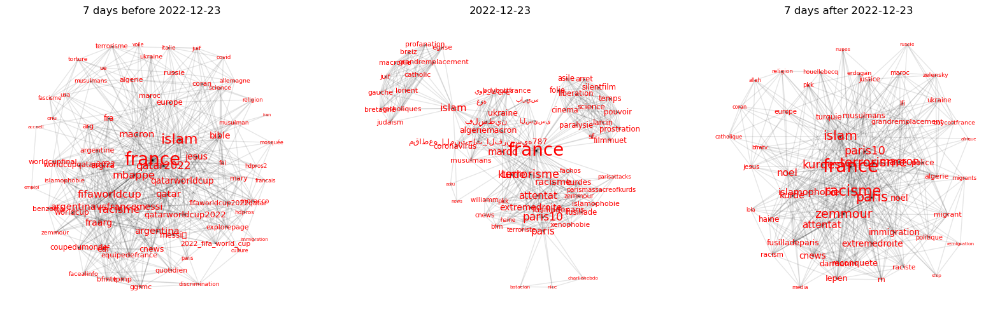

In [ ]:
unique_dataset = edges_df.dataset.unique()

for dataset, date in zip(unique_dataset, dates):
    # create graphs
    G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date<date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date==date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    G3 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset==dataset)&(edges_df.date>date)], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
    
    # remove self-loops and isolate nodes
    G1.remove_edges_from(nx.selfloop_edges(G1))
    G1.remove_nodes_from(list(nx.isolates(G1)))
    G2.remove_edges_from(nx.selfloop_edges(G2))
    G2.remove_nodes_from(list(nx.isolates(G2)))
    G3.remove_edges_from(nx.selfloop_edges(G3))
    G3.remove_nodes_from(list(nx.isolates(G3)))

    # get giant components
    Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
    Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)
    Gcc3 = sorted(nx.connected_components(G3), key=len, reverse=True)

    G01 = G1.subgraph(Gcc1[0])
    G02 = G2.subgraph(Gcc2[0])
    G03 = G3.subgraph(Gcc3[0])

    # giant component of nodes with min degree
    G01 = G01.subgraph([n for n in G01 if G01.degree(n) >= 25])
    G02 = G02.subgraph([n for n in G02 if G02.degree(n) >= 10])
    G03 = G03.subgraph([n for n in G03 if G03.degree(n) >= 25])

    # plot these giant components in one line with a loop

    dict_title = {'G01': f'7 days before {date}', 'G02': f'{date}', 'G03': f'7 days after {date}'}
    
    labels = {}

    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    for i, G in enumerate([G01, G02, G03]):
     pos = nx.kamada_kawai_layout(G)
     nx.draw_networkx_nodes(G, pos, node_size=0.1, node_color='black', ax=ax[i])
     nx.draw_networkx_edges(G, pos, alpha=0.1, ax=ax[i])
     degrees = dict(G.degree())
     max_degree = max(degrees.values())
     font_sizes = [degree for node, degree in degrees.items()]
     scaler = MinMaxScaler(feature_range=(5, 20))
     font_sizes = scaler.fit_transform(np.array(font_sizes).reshape(-1, 1))
     for j, (node, degree) in enumerate(degrees.items()):
        labels[node] = node
        font_size = font_sizes[j][0]
        nx.draw_networkx_labels(G, pos, {node: node}, font_size=font_size, font_color='red', ax=ax[i])
     ax[i].set_title(dict_title[f'G0{i+1}'])
     ax[i].axis('off')
     plt.plot(dpi=300)

Let's focus on one particular attack - Nice stabbing - and look more in depth on centrality measures.

In [ ]:
# calculate centrality measures for hashtags fron a dataset terror291020 before and after the date 2010-10-29
# create graphs
G1 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset=='terror291020')&(edges_df.date<datetime.date(2020, 10, 29))], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])
G2 = nx.from_pandas_edgelist(edges_df[(edges_df.dataset=='terror291020')&(edges_df.date>datetime.date(2020, 10, 29))], 'hashtag1', 'hashtag2', edge_attr=['date', 'dataset', 'count'])

# remove self-loops and isolate nodes
G1.remove_edges_from(nx.selfloop_edges(G1))
G1.remove_nodes_from(list(nx.isolates(G1)))
G2.remove_edges_from(nx.selfloop_edges(G2))
G2.remove_nodes_from(list(nx.isolates(G2)))

# get giant components
Gcc1 = sorted(nx.connected_components(G1), key=len, reverse=True)
Gcc2 = sorted(nx.connected_components(G2), key=len, reverse=True)

G01 = G1.subgraph(Gcc1[0])
G02 = G2.subgraph(Gcc2[0])

# calculate centrality measures
centrality_measures = ['degree_centrality', 'closeness_centrality', 'betweenness_centrality', 'eigenvector_centrality']
dict_centrality_measures = {}
for measure in centrality_measures:
    dict_centrality_measures[measure] = {}
    dict_centrality_measures[measure]['G01'] = nx.algorithms.centrality.__dict__[measure](G01)
    dict_centrality_measures[measure]['G02'] = nx.algorithms.centrality.__dict__[measure](G02)

In [ ]:
# Define function to get top n nodes based on centrality measures
def get_top_n_nodes(graph, measure, n=10):
    centrality_dict = nx.algorithms.centrality.__dict__[measure](graph)
    sorted_nodes = sorted(centrality_dict, key=centrality_dict.get, reverse=True)
    return sorted_nodes[:n]

# Define function to plot bar chart for top nodes
def plot_bar_chart(graph1, graph2, measure, n=10, ax=None):
    top_nodes1 = get_top_n_nodes(graph1, measure, n)
    top_nodes2 = get_top_n_nodes(graph2, measure, n)
    
    centrality_dict1 = nx.algorithms.centrality.__dict__[measure](graph1)
    centrality_dict2 = nx.algorithms.centrality.__dict__[measure](graph2)

    top_nodes1 = sorted(top_nodes1, key=lambda x: centrality_dict1[x], reverse=True)
    top_nodes2 = sorted(top_nodes2, key=lambda x: centrality_dict2[x], reverse=True)
    
    values1 = [centrality_dict1[node] for node in top_nodes1]
    values2 = [centrality_dict2[node] for node in top_nodes2]
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
        
    ax.barh(top_nodes1, values1, alpha=0.5, label='Before Event', color='blue')
    ax.barh(top_nodes2, values2, alpha=0.5, label='After Event', color='red')
    ax.set_xlabel(measure)
    ax.set_ylabel('Hashtags')
    ax.set_title(f'Top {n} Hashtags by {measure}')
    ax.legend()


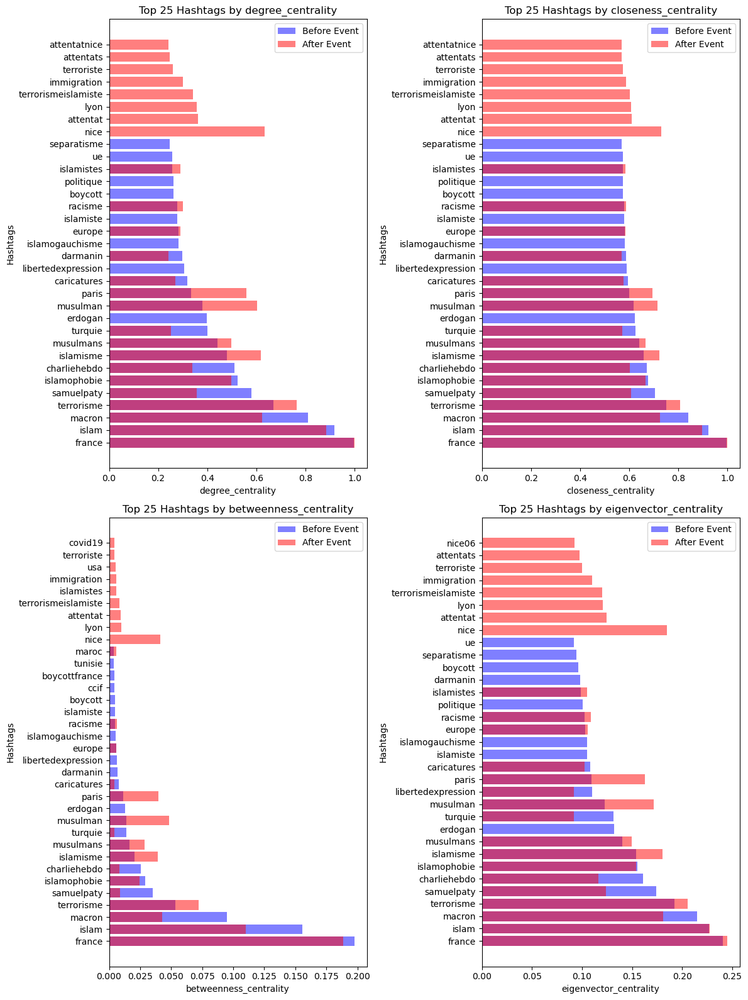

In [ ]:
# create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(12, 16))

# Plot vertical bar charts for top 10 hashtags for each centrality measure
for i, measure in enumerate(centrality_measures):
    row = i // 2
    col = i % 2
    plot_bar_chart(G01, G02, measure, n=25, ax=axs[row, col])
    
plt.tight_layout()
plt.show()

Can see that some new hashtags appeared after the attack, while some old ones disappeared. Hashtags like Paris and Musulman gained more importance, while hashtags like charliehebdo or libertedexpression lost importance. 

In [ ]:
# initialize dictionary to store centrality measures for each node in both graphs
centrality_dict = {}

# loop through each node in both graphs and populate the dictionary with their centrality measures
for node in set(G01.nodes).union(set(G02.nodes)):
    centrality_dict[node] = {
        'degree_centrality_01': dict_centrality_measures['degree_centrality']['G01'].get(node),
        'degree_centrality_02': dict_centrality_measures['degree_centrality']['G02'].get(node),
        'closeness_centrality_01': dict_centrality_measures['closeness_centrality']['G01'].get(node),
        'closeness_centrality_02': dict_centrality_measures['closeness_centrality']['G02'].get(node),
        'betweenness_centrality_01': dict_centrality_measures['betweenness_centrality']['G01'].get(node),
        'betweenness_centrality_02': dict_centrality_measures['betweenness_centrality']['G02'].get(node),
        'eigenvector_centrality_01': dict_centrality_measures['eigenvector_centrality']['G01'].get(node),
        'eigenvector_centrality_02': dict_centrality_measures['eigenvector_centrality']['G02'].get(node)
    }

In [ ]:
# convert centrality_dict to a Pandas DataFrame
centrality_df = pd.DataFrame.from_dict(centrality_dict, orient='index')

for measure in centrality_measures:
    centrality_df[f'delta_{measure}'] = centrality_df[f'{measure}_02'] - centrality_df[f'{measure}_01']

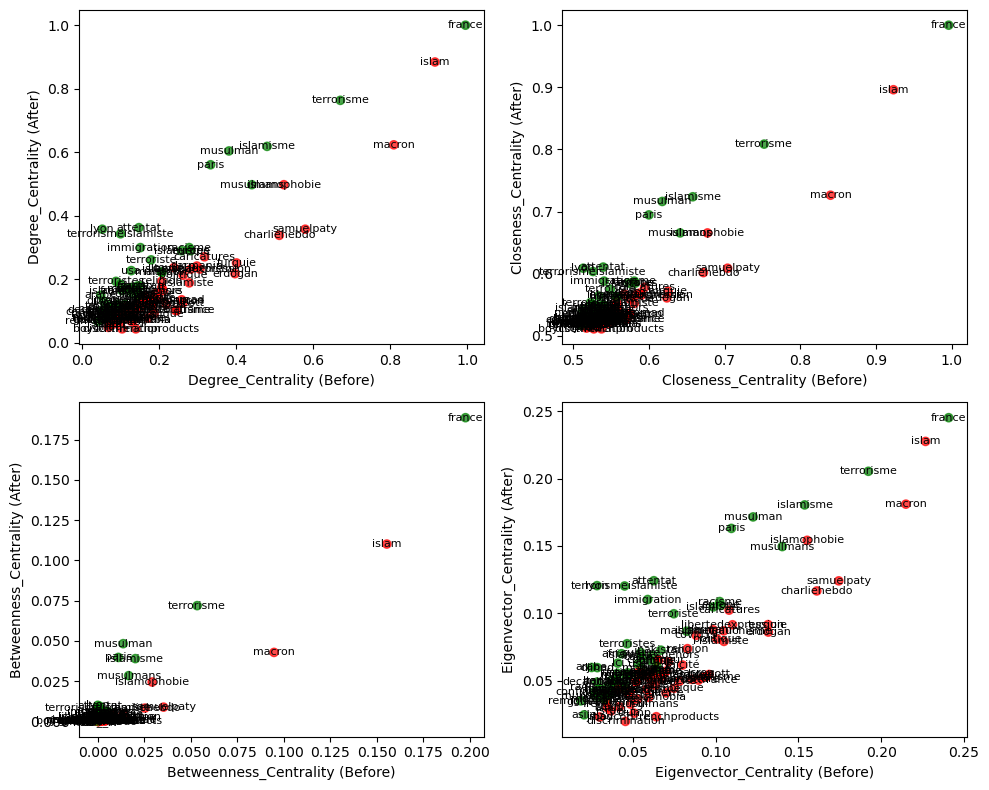

In [ ]:
# create a scatter plot of the changes in centrality measures for each node
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

centrality_df.dropna(inplace=True)

colors = np.where(centrality_df['delta_degree_centrality'] >= 0, 'g', 'r') # green if increased, red if decreased

for i, measure in enumerate(centrality_measures):
    ax = axs[i//2, i%2]
    ax.scatter(
        centrality_df[f'{measure}_01'], 
        centrality_df[f'{measure}_02'], 
        c=colors, 
        alpha=0.7
    )
    ax.set_xlabel(f'{measure.title()} (Before)')
    ax.set_ylabel(f'{measure.title()} (After)')
    for j, row in centrality_df[[f'{measure}_01', f'{measure}_02']].iterrows():
        ax.text(row[f'{measure}_01'], row[f'{measure}_02'], j, ha='center', va='center', fontsize=8)
        
plt.tight_layout()
plt.show();

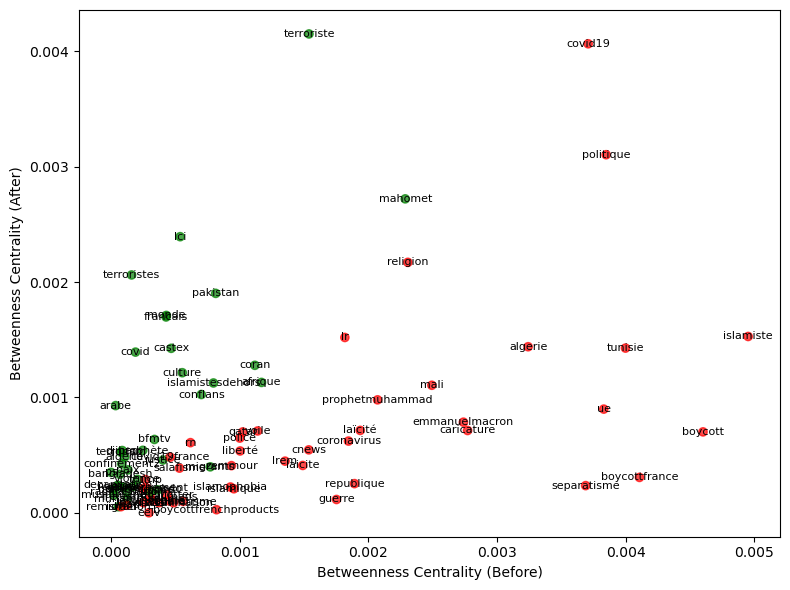

In [ ]:
# print the same scatter plot only for betweenness centrality and for the nodes from 0 to 0.005 in their centrality

fig, ax = plt.subplots(figsize=(8, 6))

ax.scatter(
    centrality_df[(centrality_df['betweenness_centrality_01'] <= 0.005) & (centrality_df['betweenness_centrality_02'] <= 0.005)]['betweenness_centrality_01'],
    centrality_df[(centrality_df['betweenness_centrality_01'] <= 0.005) & (centrality_df['betweenness_centrality_02'] <= 0.005)]['betweenness_centrality_02'],
    c=colors[(centrality_df['betweenness_centrality_01'] <= 0.005) & (centrality_df['betweenness_centrality_02'] <= 0.005)],
    alpha=0.7
)

ax.set_xlabel('Betweenness Centrality (Before)')
ax.set_ylabel('Betweenness Centrality (After)')

for j, row in centrality_df[(centrality_df['betweenness_centrality_01'] <= 0.005) & (centrality_df['betweenness_centrality_02'] <= 0.005)][['betweenness_centrality_01', 'betweenness_centrality_02']].iterrows():
    ax.text(row['betweenness_centrality_01'], row['betweenness_centrality_02'], j, ha='center', va='center', fontsize=8)

plt.tight_layout()
plt.show();

### Topic Modeling

In [ ]:
!pip install bertopic

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.7/120.7 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 18.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 61.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 62.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   

In [ ]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
corpus_embedding = list(terror_nodups['text_lemm_merged'])
model = SentenceTransformer("xlm-roberta-base")

corpus_embedding = [str(i) for i in corpus_embedding]
while("" in corpus_embedding):
    corpus_embedding.remove("")
    
document_vectors = model.encode(corpus_embedding, show_progress_bar=True)

Some weights of the model checkpoint at /root/.cache/torch/sentence_transformers/xlm-roberta-base were not used when initializing XLMRobertaModel: ['lm_head.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.bias', 'lm_head.dense.bias']
- This IS expected if you are initializing XLMRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Batches:   0%|          | 0/3330 [00:00<?, ?it/s]

In [ ]:
topic_model = BERTopic(
    embedding_model=model,
    language='French')

In [ ]:
topics = topic_model.fit_transform(corpus_embedding, document_vectors)

In [ ]:
topic_model.visualize_barchart(top_n_topics=20)

In [ ]:
for topic in topic_model.get_topic_info().head(20).index:
    print(f'Topic {topic}: {topic_model.get_topic(topic)[:7]}')

Topic 0: [('femme', 0.023407803838129876), ('porter', 0.019773055438747845), ('voilees', 0.017509923970800298), ('voile', 0.013689090158362118), ('portent', 0.010012214263199565), ('porte', 0.008421737297315485), ('jupe', 0.007800298724120938)]
Topic 1: [('racisme', 0.031032910268470933), ('niveau', 0.02216960430106639), ('argentine', 0.013410185105642304), ('systemique', 0.01150213127417362), ('delit', 0.009659867559514463), ('argentin', 0.009446632950353584), ('ordinaire', 0.008309727913146141)]
Topic 2: [('mqt', 0.08214877323330412), ('l_rswl_llh', 0.040758181042451706), ('h_lmntjt_lfrnsyh', 0.037177929971167936), ('l_rswl_llh_yfrns', 0.023219496336426136), ('_lfrnsy', 0.022161015960128684), ('produit', 0.018963434144164182), ('messager', 0.018898184525332908)]
Topic 3: [('islam', 0.015021580864294328), ('compatible', 0.013715328253461986), ('dur', 0.01332461548232976), ('probleme', 0.0109039075295288), ('soumise', 0.008443512668791139), ('lang', 0.008075408268154817), ('jack', 0.00

In [ ]:
topic_model.visualize_topics()

In [ ]:
terror_nodups['topic_BERT'] = topics[0]
terror_nodups.to_csv(path+'terror_nodups_BERT.csv.gz', compression='gzip')

##### Heatmap of topics over time

In [ ]:
terror_nodups_topics = terror_nodups[terror_nodups['topic_BERT'] != -1]
terror_nodups_topics.sort_values(by=['date'], inplace=True)
topics_heatmap = terror_nodups_topics.groupby(['date', 'topic_BERT'])['id'].count().reset_index()
topics_heatmap['id'] = np.log(topics_heatmap['id'])

In [ ]:
# Pivot table to count occurrences of each topic on each date
table1 = pd.pivot_table(topics_heatmap, values='id', index=['date'], columns=['topic_BERT'], aggfunc=len, fill_value=0)
table2 = pd.pivot_table(topics_heatmap, values='id', index=['date'], columns=['topic_BERT'], fill_value=0)

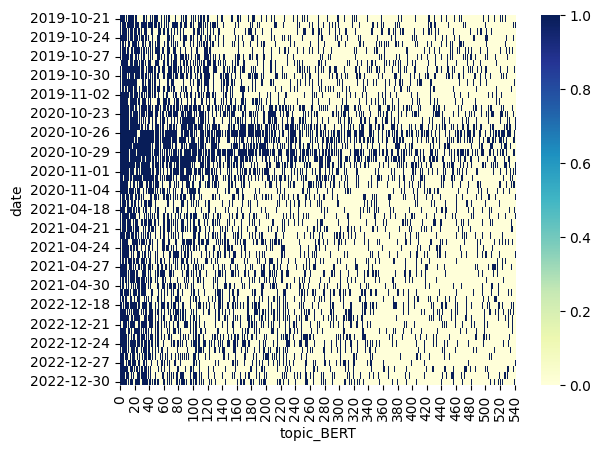

In [ ]:
sns.heatmap(table1, cmap='YlGnBu')
plt.show();

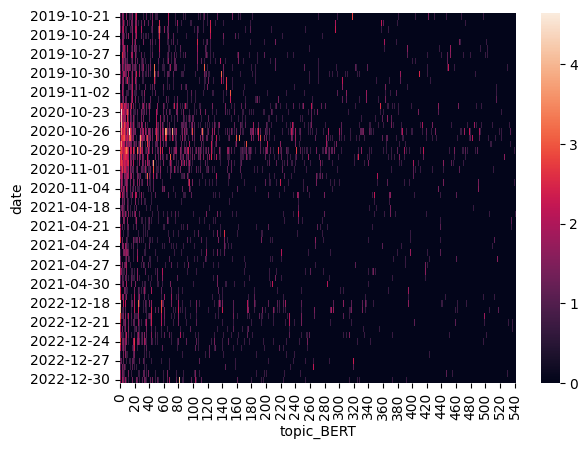

In [ ]:
sns.heatmap(table2)
sns.color_palette("flare", as_cmap=True)
plt.show();

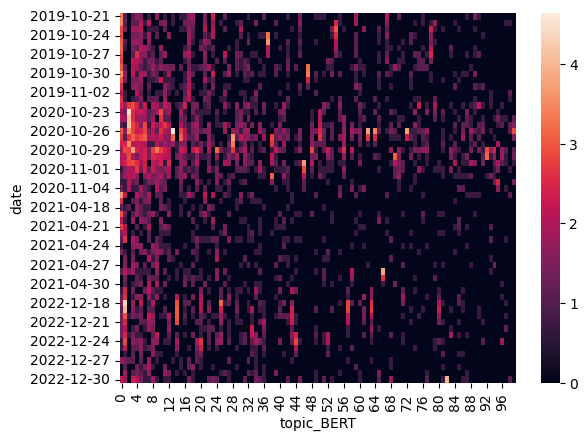

In [ ]:
sns.heatmap(table2.iloc[:, 0:100])
sns.color_palette("flare", as_cmap=True)
plt.show();